In [8]:
import cv2
import numpy as np
from shapely.geometry import Point
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely import wkt

In [9]:
# Load the GeoJSON
gdf_combined = gpd.read_file('data/Street_view/Preprocessed_to_use_for_picture_extraction.geojson')

# Recreate geometry_midpoint from midpoint_x and midpoint_y
gdf_combined['geometry_midpoint'] = gdf_combined.apply(lambda row: Point(row['midpoint_x'], row['midpoint_y']), axis=1)

# Convert the geometry_outer_edge from string to LineString
gdf_combined['geometry_outer_edge'] = gdf_combined['geometry_outer_edge'].apply(wkt.loads)


In [15]:
def calculate_yaw_pitch(camera_coords, target_coords):
    x1, y1, z1 = camera_coords
    x2, y2, z2 = target_coords

    dx = x2 - x1
    dy = y2 - y1
    dz = z2 - z1
    
    horizontal_distance = np.sqrt(dx**2 + dy**2)
    
    if horizontal_distance < 1e-6:  # Adjust this threshold as needed
        print("Warning: Camera and target are very close or directly above/below each other.")
        return 0, 90 if dz >= 0 else -90

    yaw = np.arctan2(-dy, -dx)
    yaw_deg = np.degrees(yaw)
    yaw_deg = (yaw_deg + 360) % 360
    
    pitch = np.arctan2(dz, horizontal_distance)
    pitch_deg = np.degrees(pitch)
    
    return yaw_deg, pitch_deg


def enhanced_equirectangular_to_perspective(img, fov, theta, phi, roll, height, width, output_scale=2):
    fov, theta, phi, roll = map(np.radians, (fov, theta, phi, roll))
    
    h, w = img.shape[:2]
    
    # Increase output size
    height *= output_scale
    width *= output_scale
    
    f = width / (2 * np.tan(fov / 2))
    
    Rx = np.array([[1, 0, 0], [0, np.cos(phi), -np.sin(phi)], [0, np.sin(phi), np.cos(phi)]])
    Ry = np.array([[np.cos(theta), 0, np.sin(theta)], [0, 1, 0], [-np.sin(theta), 0, np.cos(theta)]])
    Rz = np.array([[np.cos(roll), -np.sin(roll), 0], [np.sin(roll), np.cos(roll), 0], [0, 0, 1]])
    
    R = Rz @ Ry @ Rx
    
    y, x = np.indices((height, width))
    x = (x - width / 2) / f
    y = (y - height / 2) / f
    
    directions = np.dstack([x, y, np.ones_like(x)])
    directions /= np.linalg.norm(directions, axis=2, keepdims=True)
    
    directions = directions @ R.T
    
    theta_p = np.arctan2(directions[:,:,0], directions[:,:,2])
    phi_p = np.arcsin(np.clip(directions[:,:,1], -1, 1))
    
    u = (theta_p / (2 * np.pi) + 0.5) * w
    v = (phi_p / np.pi + 0.5) * h
    
    u = np.clip(u, 0, w - 1)
    v = np.clip(v, 0, h - 1)
    
    u_floor, v_floor = np.floor(u).astype(int), np.floor(v).astype(int)
    u_ceil, v_ceil = np.minimum(u_floor + 1, w - 1), np.minimum(v_floor + 1, h - 1)
    
    wu, wv = u - u_floor, v - v_floor
    
    top_left = img[v_floor, u_floor]
    top_right = img[v_floor, u_ceil]
    bottom_left = img[v_ceil, u_floor]
    bottom_right = img[v_ceil, u_ceil]
    
    output = (1 - wu[:,:,np.newaxis]) * ((1 - wv[:,:,np.newaxis]) * top_left + wv[:,:,np.newaxis] * bottom_left) + \
              wu[:,:,np.newaxis] * ((1 - wv[:,:,np.newaxis]) * top_right + wv[:,:,np.newaxis] * bottom_right)
    
    return output.astype(np.uint8)

def convert_bgr_to_rgb(image):
    # Converts the image from OpenCV's BGR format to RGB for correct color representation
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def calculate_dynamic_fov(v1, v2):
    """
    Calculate the dynamic Field of View based on the vectors v1 and v2.
    
    Parameters:
    v1, v2: numpy arrays representing the vectors
    
    Returns:
    fov: The calculated Field of View in degrees, capped at 120°
    """
    # Ensure v1 and v2 are numpy arrays
    v1 = np.array(v1)
    v2 = np.array(v2)
    
    # Calculate the dot product of v1 and v2
    dot_product = np.dot(v1, v2)
    
    # Calculate the magnitudes of v1 and v2
    magnitude_product = np.linalg.norm(v1) * np.linalg.norm(v2)
    
    # Calculate the FoV using the arccos function
    fov_radians = np.arccos(dot_product / magnitude_product)
    
    # Convert to degrees
    fov_degrees = np.degrees(fov_radians)
    
    # Cap the FoV at 120°
    fov = min(fov_degrees, 120)
    
    return fov

def calculate_vectors(camera_coords, target_coords):
    """
    Calculate the vectors v1 and v2 based on camera and target coordinates.
    
    Parameters:
    camera_coords: (x, y, z) coordinates of the camera
    target_coords: (x, y, z) coordinates of the target
    
    Returns:
    v1, v2: numpy arrays representing the vectors
    """
    camera = np.array(camera_coords)
    target = np.array(target_coords)
    
    # Calculate v2 (vector from camera to target)
    v2 = target - camera
    
    # Assume v1 is the forward-facing vector of the camera
    # For simplicity, let's assume it's pointing along the x-axis
    v1 = np.array([1, 0, 0])
    
    return v1, v2

def adjust_fov_based_on_distance(camera_coords, midpoint_coords, calculated_fov):
    """
    Adjust the field of view based on the distance between the camera and the midpoint.
    Wider FoV (e.g., 110) is used when very close, and calculated FoV when farther away.
    
    Parameters:
    - camera_coords: (x, y, z) of the camera
    - midpoint_coords: (x, y, z) of the midpoint
    - calculated_fov: the dynamically calculated FoV based on angle
    
    Returns:
    - Adjusted FoV
    """
    x1, y1, _ = camera_coords
    x2, y2, _ = midpoint_coords
    
    # Calculate the Euclidean distance between the camera and the midpoint
    distance = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

    print(f"Distance: {distance}")
    
    if 3.5 < distance < 5:  # If very close, set a wider FoV (e.g., 110 degrees)
        return 100, distance
    elif distance <3.5:
        return 110, distance
    else:
        # Use the dynamically calculated FoV if the distance is larger
        return calculated_fov, distance

def calculate_new_target(midpoint_coords, facade_start, facade_end, camera_coords, orientation):
    """
    Calculate a new target based on the camera's position relative to the midpoint and facade's start or end,
    depending on whether the camera surpasses the midpoint along the relevant axis (x or y).
    
    Parameters:
    - midpoint_coords: (x, y) coordinates of the midpoint (ignore z)
    - facade_start: (x, y) coordinates of one endpoint of the facade segment
    - facade_end: (x, y) coordinates of the other endpoint of the facade segment
    - camera_coords: (x, y) coordinates of the camera
    - orientation: The facade's orientation (N, S -> x-axis; E, W -> y-axis)
    
    Returns:
    - new_target_coords: The new target coordinates (x, y) or the original midpoint if the condition isn't met.
    """
    # Convert to numpy arrays for vector calculations
    midpoint = np.array(midpoint_coords[:2])
    facade_start = np.array(facade_start[:2])
    facade_end = np.array(facade_end[:2])
    camera = np.array(camera_coords[:2])

    # Calculate the length of the facade segment
    facade_length = np.linalg.norm(facade_end - facade_start)

    # Determine if we should compare x-coordinates (for N/S) or y-coordinates (for E/W)
    if orientation in ['N', 'S']:
        # Compare x-coordinates
        axis_diff = camera[0] - midpoint[0]  # Negative if before the midpoint, positive if after
    elif orientation in ['E', 'W']:
        # Compare y-coordinates
        axis_diff = camera[1] - midpoint[1]  # Negative if before the midpoint, positive if after
    else:
        return midpoint  # Return the original midpoint if orientation is unknown

    print(f"Axis difference: {axis_diff}, Facade half-length: {facade_length / 2}")

    # Calculate the distance between the camera and the two extremes of the facade
    dist_to_start = np.linalg.norm(facade_start - camera)
    dist_to_end = np.linalg.norm(facade_end - camera)

    if np.abs(axis_diff) > facade_length / 2:
        # Choose the closest point (either facade_start or facade_end)
        if dist_to_start < dist_to_end:
            new_target = (midpoint + facade_start) / 2  # Midpoint between facade midpoint and facade_end
        else:
            new_target = (midpoint + facade_end) / 2  # Midpoint between facade midpoint and facade_start
    else:
        new_target = midpoint # Camera is within the threshold, use the original midpoint

    print(f"New target: {new_target}, Midpoint: {midpoint}")

    return new_target

Axis difference: -0.3374258038820699, Facade half-length: 1.748200361091712
New target: [ 605189.9574258  4962337.06189515], Midpoint: [ 605189.9574258  4962337.06189515]
Distance: 2.736775955028779
82.91780039245711 110
block_0 34 182136815 POINT (605189.9574258039 4962337.061895148) S pano_000117_000042.jpg


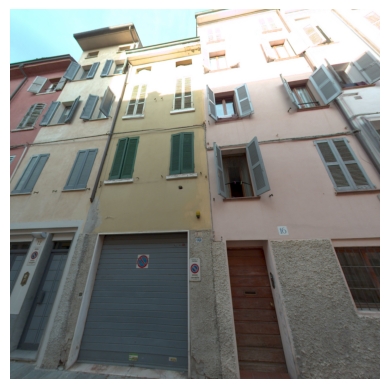

Axis difference: 0.1623554725665599, Facade half-length: 1.8439873031729301
New target: [ 605186.73964453 4962338.6537219 ], Midpoint: [ 605186.73964453 4962338.6537219 ]
Distance: 3.077008157232727
93.02456302756967 110
block_0 76 182137529 POINT (605186.7396445274 4962338.653721904) S pano_000117_000043.jpg


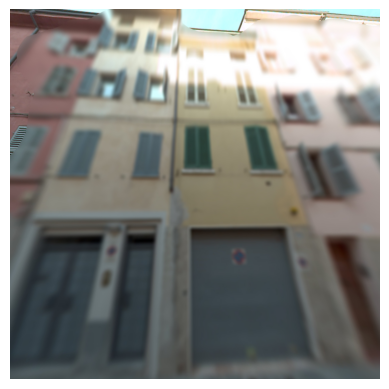

Axis difference: -1.3863835118245333, Facade half-length: 2.6989311131630207
New target: [ 605182.74138351 4962340.81057021], Midpoint: [ 605182.74138351 4962340.81057021]
Distance: 3.1491606064152977
63.88086476695311 110
block_0 124 182138139 POINT (605182.7413835118 4962340.810570208) S pano_000117_000045.jpg


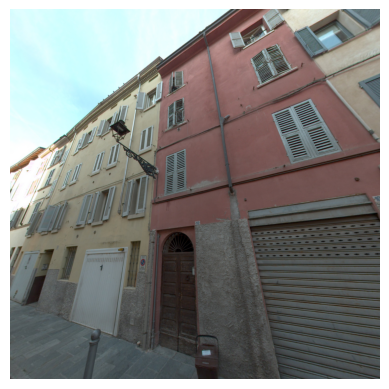

Axis difference: -1.3618037680862471, Facade half-length: 3.634208915995016
New target: [ 605177.14780377 4962343.78022604], Midpoint: [ 605177.14780377 4962343.78022604]
Distance: 3.6238365862048925
67.926814095519 100
block_0 12 182136647 POINT (605177.147803768 4962343.780226035) S pano_000117_000047.jpg


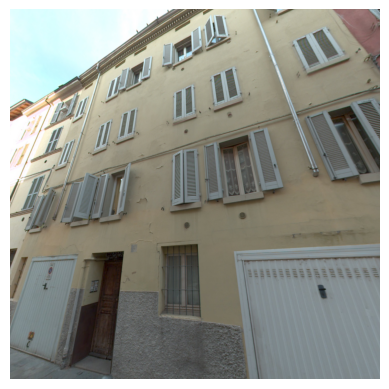

Axis difference: -1.913370199734345, Facade half-length: 1.8889999093037912
New target: [ 605171.25531359 4962346.40609894], Midpoint: [ 605172.1463702  4962346.09289247]
Distance: 3.7756205469492525
74.01220202522285 100
block_0 12 182136647 POINT (605172.1463701997 4962346.092892471) S pano_000117_000049.jpg


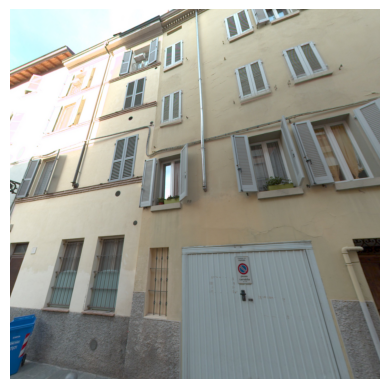

Axis difference: -0.11642152967397124, Facade half-length: 2.932014104940329
New target: [ 605167.58442153 4962347.65162591], Midpoint: [ 605167.58442153 4962347.65162591]
Distance: 3.6694732318857435
88.18186931274245 100
block_0 117 182137984 POINT (605167.5844215297 4962347.651625912) S pano_000117_000050.jpg


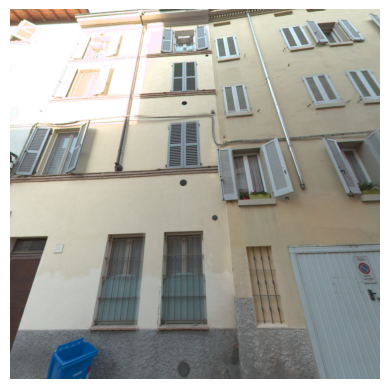

Axis difference: 0.34209651045966893, Facade half-length: 9.45947615392631
New target: [ 605155.86690349 4962351.68225551], Midpoint: [ 605155.86690349 4962351.68225551]
Distance: 3.2194823873591414
96.09966359766375 110
block_0 168 2427045 POINT (605155.8669034896 4962351.6822555065) S pano_000117_000054.jpg


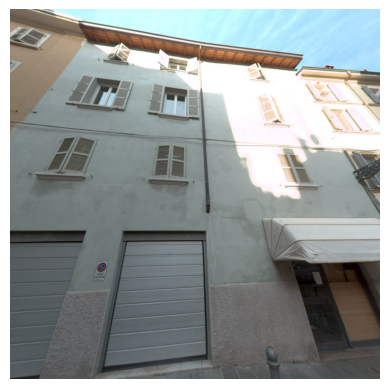

Axis difference: -1.5504482684191316, Facade half-length: 3.721641076543005
New target: [ 605143.45844827 4962356.12382539], Midpoint: [ 605143.45844827 4962356.12382539]
Distance: 2.9161493973254466
57.88119689741341 110
block_0 64 182137239 POINT (605143.4584482685 4962356.123825394) S pano_000117_000059.jpg


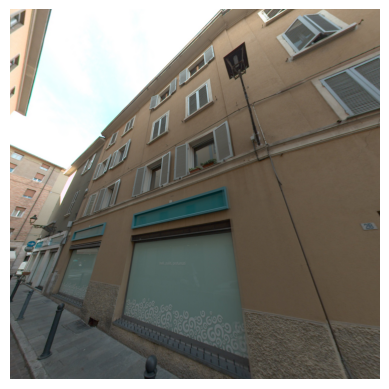

Axis difference: -0.9296334473183379, Facade half-length: 9.13182851882689
New target: [ 605131.55363345 4962360.96811813], Midpoint: [ 605131.55363345 4962360.96811813]
Distance: 2.9209987247413816
71.44234497774916 110
block_0 181 2427080 POINT (605131.5536334473 4962360.968118127) S pano_000117_000063.jpg


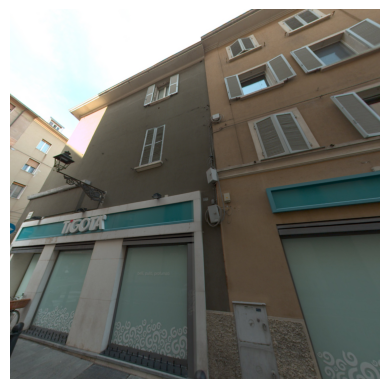

Axis difference: 3.5874040168710053, Facade half-length: 3.9654957824265504
New target: [ 605134.27059598 4962390.96319804], Midpoint: [ 605134.27059598 4962390.96319804]
Distance: 7.496849290970828
118.58888720532043 118.58888720532043
block_0 6 182136604 POINT (605134.2705959831 4962390.963198035) N pano_000116_000069.jpg


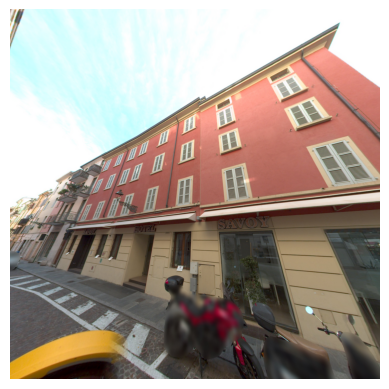

Axis difference: 1.4837414437206462, Facade half-length: 7.226570444693273
New target: [ 605144.77125856 4962387.0904172 ], Midpoint: [ 605144.77125856 4962387.0904172 ]
Distance: 7.193270222266305
101.90373648620799 101.90373648620799
block_0 4 182136595 POINT (605144.7712585563 4962387.090417201) N pano_000116_000066.jpg


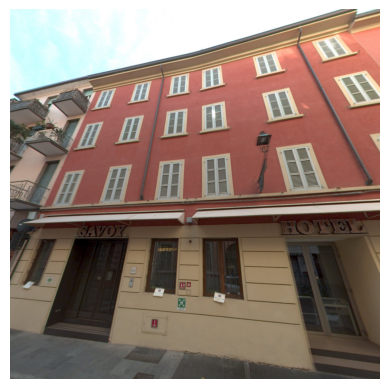

Axis difference: 2.374701385619119, Facade half-length: 3.9360192915112915
New target: [ 605155.24029861 4962383.21713093], Midpoint: [ 605155.24029861 4962383.21713093]
Distance: 7.135606890710485
109.43856906449294 109.43856906449294
block_0 136 182138240 POINT (605155.2402986144 4962383.2171309255) N pano_000116_000062.jpg


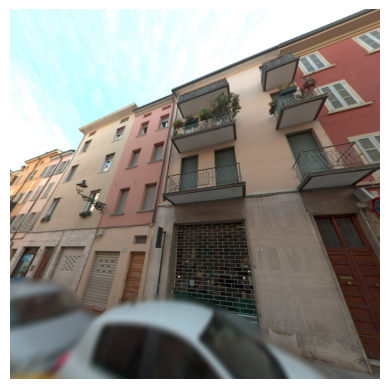

Axis difference: 2.322587960632518, Facade half-length: 2.1635488488663466
New target: [ 605159.94374265 4962381.46903301], Midpoint: [ 605160.95841204 4962381.09395709]
Distance: 7.161150198697376
117.5434210936293 117.5434210936293
block_0 122 182138083 POINT (605160.9584120393 4962381.093957091) N pano_000116_000060.jpg


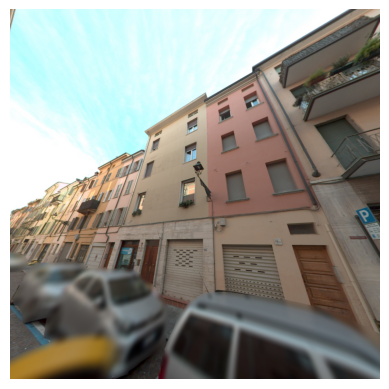

Axis difference: 2.3826741666998714, Facade half-length: 3.7701340924373814
New target: [ 605166.52132583 4962379.02936293], Midpoint: [ 605166.52132583 4962379.02936293]
Distance: 7.100352247855278
109.60727984687583 109.60727984687583
block_0 5 182136600 POINT (605166.5213258333 4962379.02936293) N pano_000116_000058.jpg


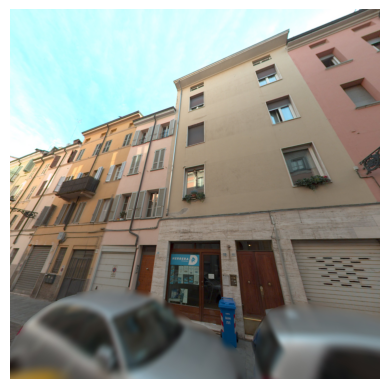

Axis difference: 2.6653169476194307, Facade half-length: 1.9367442555659464
New target: [ 605172.77107415 4962376.68433638], Midpoint: [ 605171.86568305 4962377.02786445]
Distance: 7.021658740062881
104.4298497042135 104.4298497042135
block_0 112 182137955 POINT (605171.8656830523 4962377.027864454) N pano_000116_000056.jpg


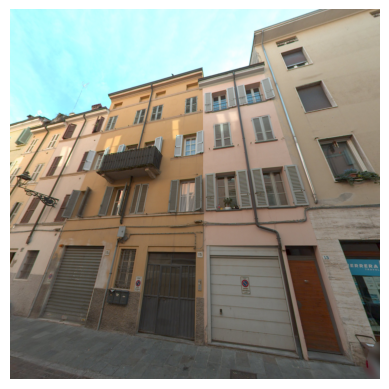

Axis difference: 3.405218734405935, Facade half-length: 3.3616194378930575
New target: [ 605178.40943928 4962374.6015416 ], Midpoint: [ 605176.83178127 4962375.18129717]
Distance: 7.016415996589163
105.22608349597441 105.22608349597441
block_0 109 182137941 POINT (605176.8317812656 4962375.18129717) N pano_000116_000054.jpg


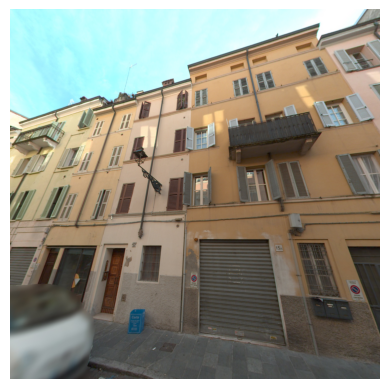

Axis difference: 1.2811643677996472, Facade half-length: 1.9404197295303445
New target: [ 605181.80183563 4962373.33479735], Midpoint: [ 605181.80183563 4962373.33479735]
Distance: 7.033863890203779
100.49456948497321 100.49456948497321
block_0 108 182137940 POINT (605181.8018356322 4962373.334797351) N pano_000116_000053.jpg


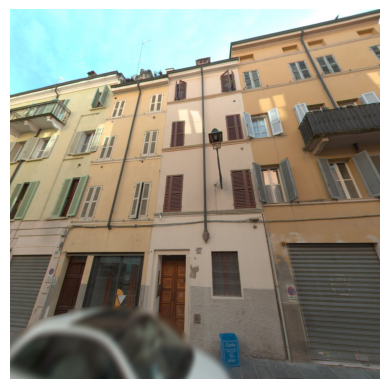

Axis difference: 3.1897131172008812, Facade half-length: 2.1340922863591154
New target: [ 605186.61314333 4962371.52181606], Midpoint: [ 605185.61428688 4962371.89714693]
Distance: 6.987383767279174
108.38379140128234 108.38379140128234
block_0 94 182137728 POINT (605185.6142868828 4962371.897146926) N pano_000116_000051.jpg


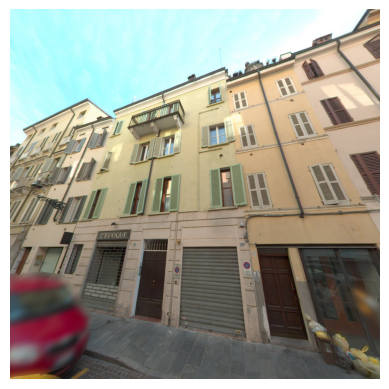

Axis difference: 2.6898265233030543, Facade half-length: 4.470883747803008
New target: [ 605191.80217348 4962369.58723988], Midpoint: [ 605191.80217348 4962369.58723988]
Distance: 6.9208551729014545
112.8708494110525 112.8708494110525
block_0 169 2427048 POINT (605191.8021734767 4962369.587239882) N pano_000116_000049.jpg


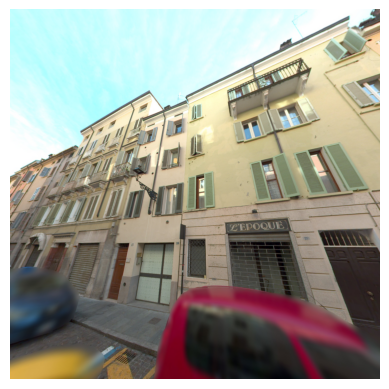

Axis difference: 2.5386155516607687, Facade half-length: 1.75879318672112
New target: [ 605198.47490309 4962367.13526762], Midpoint: [ 605197.64738445 4962367.43284327]
Distance: 6.8573657947588
104.39285896802886 104.39285896802886
block_0 101 182137837 POINT (605197.6473844483 4962367.4328432735) N pano_000116_000047.jpg


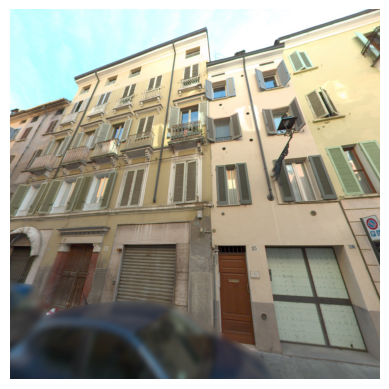

Axis difference: 1.338270738022402, Facade half-length: 5.576920512598223
New target: [ 605204.51972926 4962364.86747764], Midpoint: [ 605204.51972926 4962364.86747764]
Distance: 6.97412753878838
101.06314826806616 101.06314826806616
block_0 34 182136815 POINT (605204.519729262 4962364.867477639) N pano_000116_000045.jpg


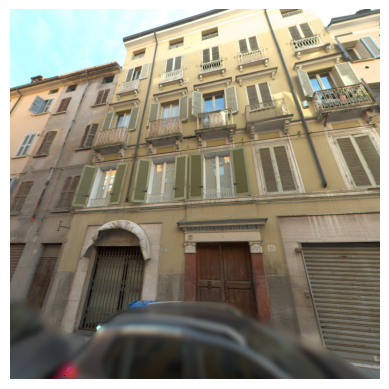

Axis difference: 2.4899071701802313, Facade half-length: 2.3232199629394583
New target: [ 605213.01912085 4962361.72595463], Midpoint: [ 605211.92509283 4962362.11639086]
Distance: 6.955543517214027
101.46084537487259 101.46084537487259
block_0 16 182136664 POINT (605211.9250928299 4962362.116390858) N pano_000116_000042.jpg


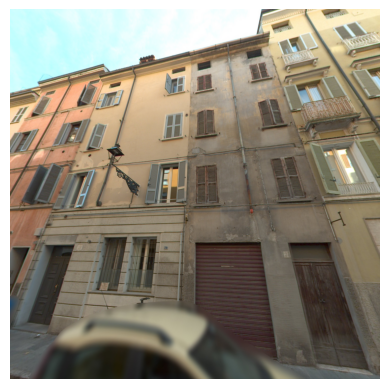

Axis difference: 3.254099677898921, Facade half-length: 2.9136000417098336
New target: [ 605218.23627605 4962359.8863052 ], Midpoint: [ 605216.86190032 4962360.36937627]
Distance: 6.958400460954078
105.82060981430763 105.82060981430763
block_0 15 182136662 POINT (605216.8619003221 4962360.36937627) N pano_000116_000040.jpg


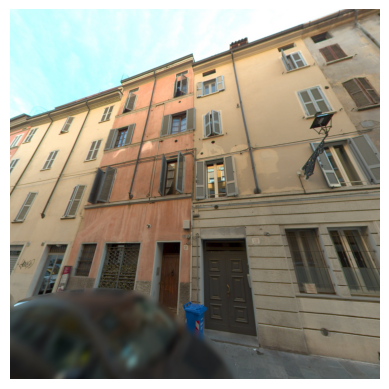

Axis difference: 3.3349763586884364, Facade half-length: 3.05546994975913
New target: [ 605223.92520957 4962357.85715573], Midpoint: [ 605222.48702364 4962358.3725152 ]
Distance: 6.898214699845341
106.14131367973538 106.14131367973538
block_0 166 2427037 POINT (605222.4870236414 4962358.372515196) N pano_000116_000038.jpg


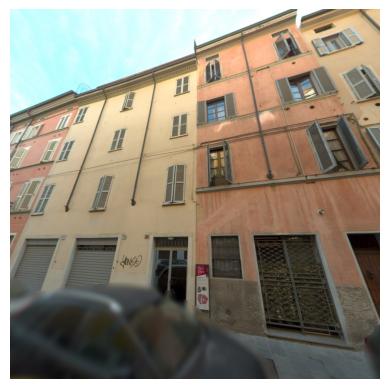

Axis difference: 1.4762579340022057, Facade half-length: 5.011695539709118
New target: [ 605230.08174207 4962355.65232951], Midpoint: [ 605230.08174207 4962355.65232951]
Distance: 6.866247461839499
102.41565316105148 102.41565316105148
block_0 14 182136652 POINT (605230.081742066 4962355.65232951) N pano_000116_000036.jpg


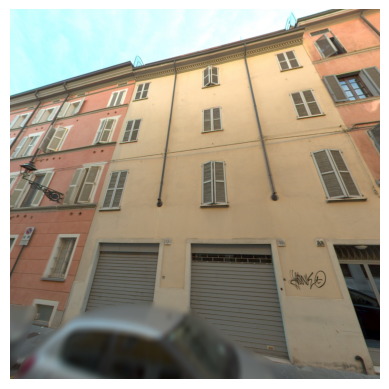

Axis difference: 1.526779142091982, Facade half-length: 7.054893894428406
New target: [ 605241.45522086 4962351.62176411], Midpoint: [ 605241.45522086 4962351.62176411]
Distance: 6.715106888495123
103.14197780300215 103.14197780300215
block_0 28 182136749 POINT (605241.4552208579 4962351.621764114) N pano_000116_000032.jpg


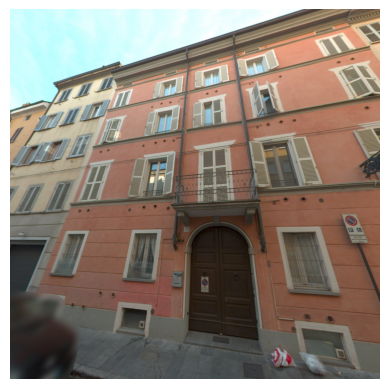

Axis difference: 3.2814227918861434, Facade half-length: 3.2352930258765915
New target: [ 605252.65868927 4962347.58843022], Midpoint: [ 605251.14257721 4962348.15250863]
Distance: 6.738452653557371
105.30750524662774 105.30750524662774
block_0 103 182137892 POINT (605251.1425772081 4962348.152508633) N pano_000116_000028.jpg


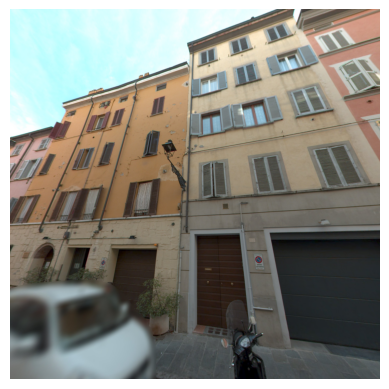

Axis difference: 1.0696760001592338, Facade half-length: 5.1812704723469
New target: [ 605259.052324   4962345.27639977], Midpoint: [ 605259.052324   4962345.27639977]
Distance: 6.787418996361651
99.06743748187495 99.06743748187495
block_0 10 182136612 POINT (605259.0523239998 4962345.276399767) N pano_000116_000026.jpg


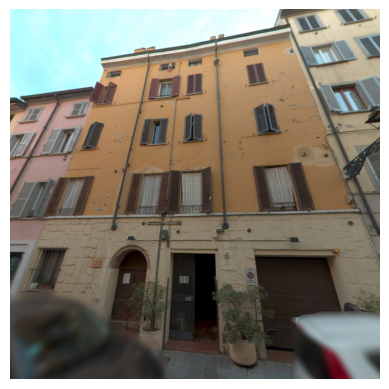

Axis difference: 2.3737861836561933, Facade half-length: 2.4910558961778166
New target: [ 605266.27321382 4962342.68346851], Midpoint: [ 605266.27321382 4962342.68346851]
Distance: 6.5871183459586335
111.12279339870574 111.12279339870574
block_0 72 182137474 POINT (605266.2732138163 4962342.683468508) N pano_000116_000023.jpg


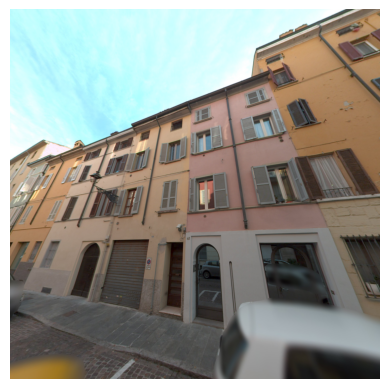

Axis difference: 3.3475958220660686, Facade half-length: 2.501039221979455
New target: [ 605272.13231579 4962340.52936655], Midpoint: [ 605270.96040418 4962340.96574079]
Distance: 6.694371676483456
109.24018466856916 109.24018466856916
block_0 133 182138214 POINT (605270.9604041779 4962340.96574079) N pano_000116_000021.jpg


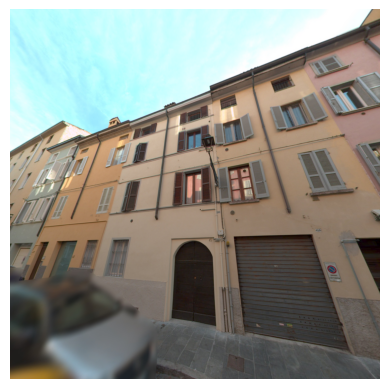

Axis difference: 3.5362996939802542, Facade half-length: 3.488028481071284
New target: [ 605278.22193676 4962338.30682165], Midpoint: [ 605276.58270031 4962338.90221187]
Distance: 6.8587210400801855
106.33641336696488 106.33641336696488
block_0 121 182138080 POINT (605276.582700306 4962338.902211865) N pano_000116_000019.jpg


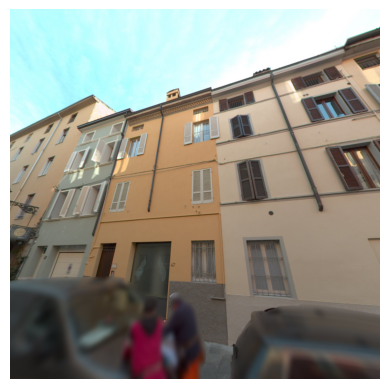

Axis difference: 1.235124705475755, Facade half-length: 2.0252336565039095
New target: [ 605281.76687529 4962337.02596009], Midpoint: [ 605281.76687529 4962337.02596009]
Distance: 6.867029726129836
100.36178121636931 100.36178121636931
block_0 84 182137642 POINT (605281.7668752945 4962337.025960088) N pano_000116_000018.jpg


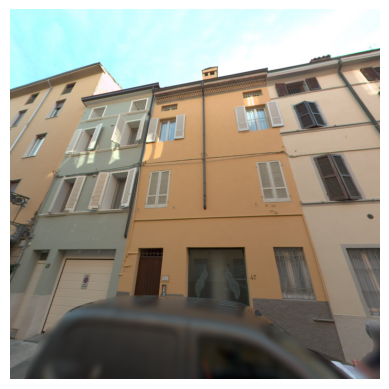

Axis difference: 2.4244874749565497, Facade half-length: 2.7400549310602984
New target: [ 605286.23551253 4962335.37133219], Midpoint: [ 605286.23551253 4962335.37133219]
Distance: 6.7939923279291285
110.90733251616055 110.90733251616055
block_0 116 182137975 POINT (605286.2355125251 4962335.371332195) N pano_000116_000016.jpg


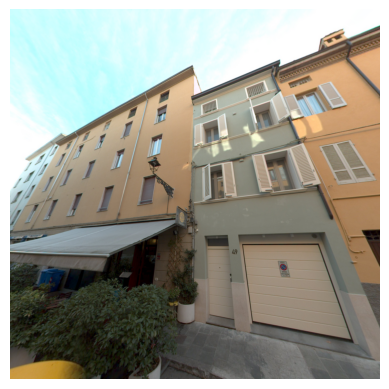

Axis difference: 2.9736155678983778, Facade half-length: 2.7400557109837993
New target: [ 605292.64285281 4962332.94844385], Midpoint: [ 605291.36138443 4962333.43302112]
Distance: 6.831151427496812
104.30827125765035 104.30827125765035
block_0 47 182136877 POINT (605291.3613844321 4962333.433021115) N pano_000116_000014.jpg


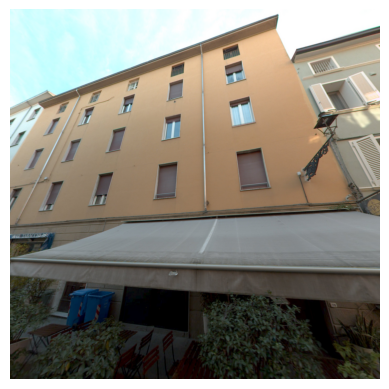

Axis difference: 2.361972637474537, Facade half-length: 7.082136824988627
New target: [ 605300.42502736 4962329.65362083], Midpoint: [ 605300.42502736 4962329.65362083]
Distance: 6.954750618675
109.85372615012041 109.85372615012041
block_0 47 182136877 POINT (605300.4250273625 4962329.653620832) N pano_000116_000011.jpg


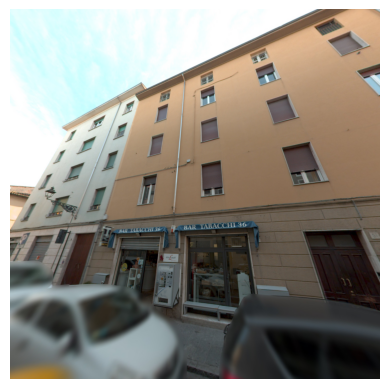

Axis difference: 3.5310086022363976, Facade half-length: 6.744850051420368
New target: [ 605313.1119914  4962324.15577095], Midpoint: [ 605313.1119914  4962324.15577095]
Distance: 7.037213882687413
120 120
block_0 8 182136607 POINT (605313.1119913978 4962324.155770952) N pano_000116_000006.jpg


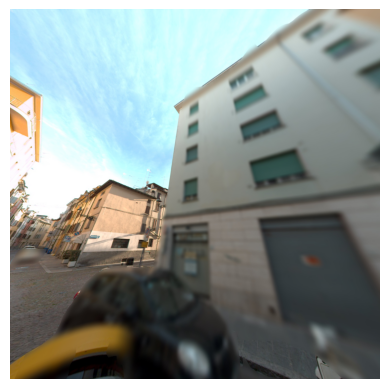

Axis difference: 3.762578443973325, Facade half-length: 2.045035434575985
New target: [ 605322.11250771 4962320.2475802 ], Midpoint: [ 605321.17442156 4962320.65444241]
Distance: 6.762040073109462
115.11543332723086 115.11543332723086
block_0 62 182137189 POINT (605321.1744215561 4962320.654442409) N pano_000116_000003.jpg


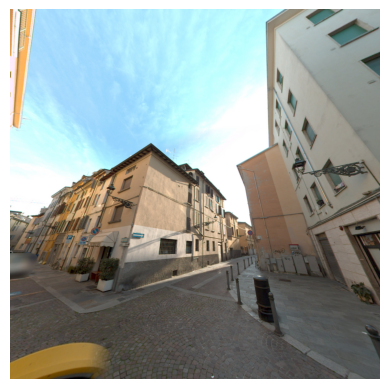

Axis difference: -0.9086041913833469, Facade half-length: 3.2308559546799134
New target: [ 605301.17460419 4962287.99829687], Midpoint: [ 605301.17460419 4962287.99829687]
Distance: 4.247614167854027
77.648453543658 100
block_0 74 182137491 POINT (605301.1746041913 4962287.998296874) S pano_000117_000002.jpg


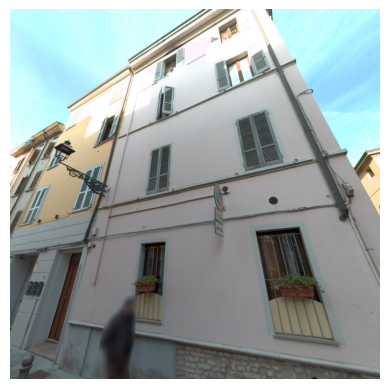

Axis difference: -0.881158982985653, Facade half-length: 6.180631517966062
New target: [ 605292.61115898 4962291.90256438], Midpoint: [ 605292.61115898 4962291.90256438]
Distance: 4.6105502999733
78.98196555707634 100
block_0 163 2427027 POINT (605292.611158983 4962291.902564376) S pano_000117_000005.jpg


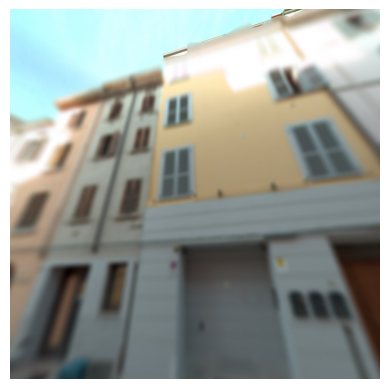

Axis difference: -1.3907103209057823, Facade half-length: 2.335305594928094
New target: [ 605284.86071032 4962295.43125693], Midpoint: [ 605284.86071032 4962295.43125693]
Distance: 4.360002583742973
71.39934959512908 100
block_0 69 182137376 POINT (605284.8607103209 4962295.431256929) S pano_000117_000008.jpg


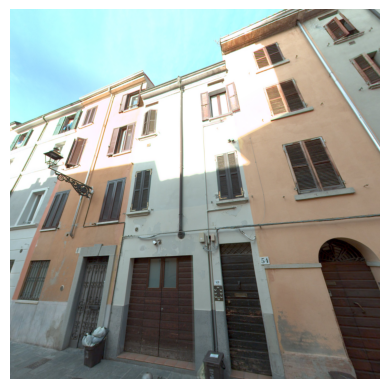

Axis difference: -2.5476998349186033, Facade half-length: 2.375844827995829
New target: [ 605279.50267579 4962297.89911693], Midpoint: [ 605280.58069983 4962297.40009407]
Distance: 4.304112929872523
69.67682697930618 100
block_0 137 182138243 POINT (605280.580699835 4962297.40009407) S pano_000117_000010.jpg


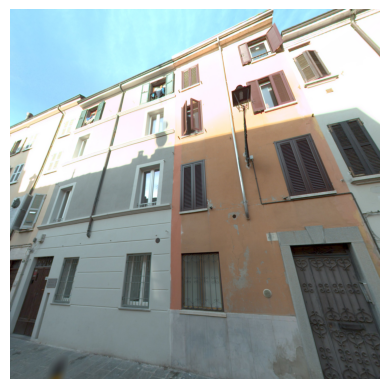

Axis difference: -2.824261464411393, Facade half-length: 3.330868588578282
New target: [ 605275.39226146 4962299.77628883], Midpoint: [ 605275.39226146 4962299.77628883]
Distance: 4.258551736645965
48.45579857422397 100
block_0 1 182136570 POINT (605275.3922614644 4962299.776288828) S pano_000117_000012.jpg


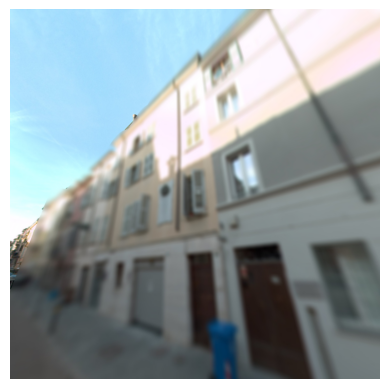

Axis difference: -1.0788577912608162, Facade half-length: 4.596763394743478
New target: [ 605268.17585779 4962303.05818827], Midpoint: [ 605268.17585779 4962303.05818827]
Distance: 4.002336985649004
74.36209489362226 100
block_0 11 182136621 POINT (605268.1758577912 4962303.058188269) S pano_000117_000014.jpg


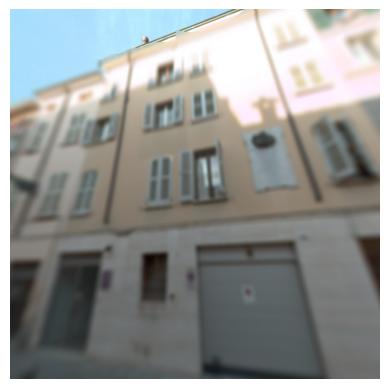

Axis difference: -0.7390605787513778, Facade half-length: 1.8625729602101273
New target: [ 605262.30206058 4962305.74539811], Midpoint: [ 605262.30206058 4962305.74539811]
Distance: 4.078912273244686
79.56088319838649 100
block_0 2 182136574 POINT (605262.3020605787 4962305.74539811) S pano_000117_000016.jpg


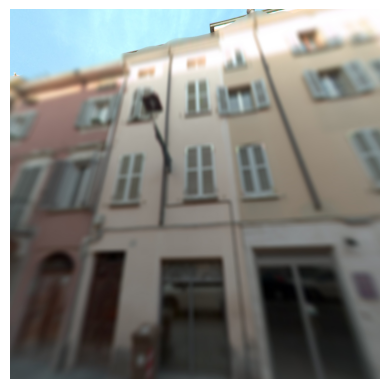

Axis difference: -2.053920418722555, Facade half-length: 2.78068367495748
New target: [ 605258.08192042 4962307.68189634], Midpoint: [ 605258.08192042 4962307.68189634]
Distance: 4.006429326137638
59.15908649556348 100
block_0 120 182138057 POINT (605258.0819204188 4962307.681896344) S pano_000117_000018.jpg


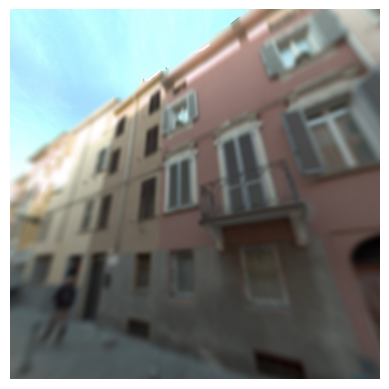

Axis difference: -2.8471693218452856, Facade half-length: 2.4353369019213735
New target: [ 605252.22247195 4962310.33879475], Midpoint: [ 605253.33216932 4962309.83750821]
Distance: 4.329412079580943
65.21484993655741 100
block_0 71 182137460 POINT (605253.3321693218 4962309.837508211) S pano_000117_000020.jpg


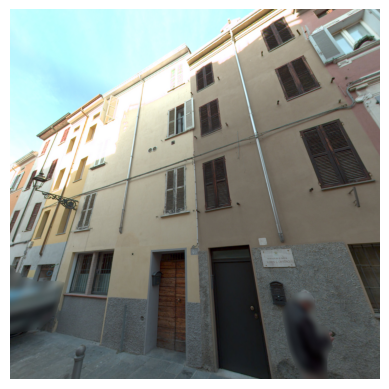

Axis difference: -0.8962439637398347, Facade half-length: 2.8236151841144426
New target: [ 605248.55024396 4962312.02593102], Midpoint: [ 605248.55024396 4962312.02593102]
Distance: 4.424651902819287
78.31347792383185 100
block_0 167 2427043 POINT (605248.5502439637 4962312.025931019) S pano_000117_000021.jpg


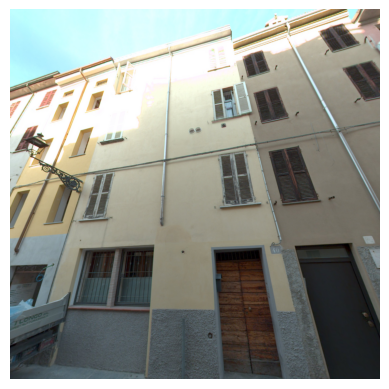

Axis difference: -2.4605539590120316, Facade half-length: 1.6940794951675489
New target: [ 605243.64597426 4962314.1984646 ], Midpoint: [ 605244.42655396 4962313.86956999]
Distance: 4.600817989903869
68.27608236706736 100
block_0 111 182137952 POINT (605244.426553959 4962313.869569985) S pano_000117_000023.jpg


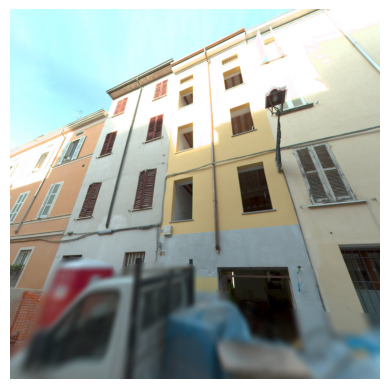

Axis difference: -1.0005629932275042, Facade half-length: 2.8072303017924467
New target: [ 605240.20856299 4962315.43388444], Midpoint: [ 605240.20856299 4962315.43388444]
Distance: 4.2454739101369965
76.36843318047544 100
block_0 26 182136738 POINT (605240.2085629932 4962315.433884441) S pano_000117_000024.jpg


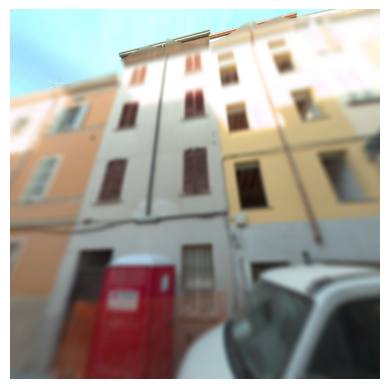

Axis difference: -2.7292719583492726, Facade half-length: 1.134754915273321
New target: [ 605236.04954223 4962317.14083594], Midpoint: [ 605236.55027196 4962316.87402718]
Distance: 3.8174116253523667
52.79849612467425 100
block_0 183 2427083 POINT (605236.5502719583 4962316.874027181) S pano_000117_000026.jpg


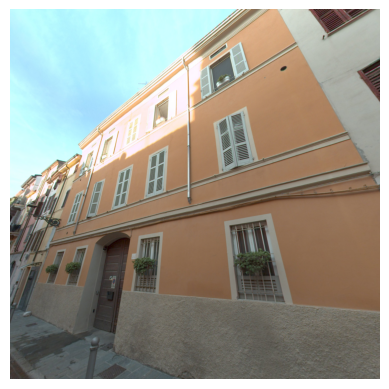

Axis difference: -1.3591200548689812, Facade half-length: 6.357556121487909
New target: [ 605229.80112005 4962320.12472981], Midpoint: [ 605229.80112005 4962320.12472981]
Distance: 3.3763616610987954
66.2629480616248 110
block_0 183 2427083 POINT (605229.8011200549 4962320.1247298075) S pano_000117_000028.jpg


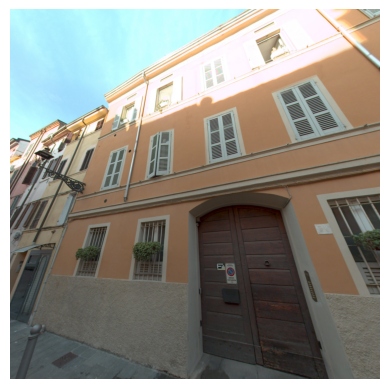

Axis difference: -2.263095326256007, Facade half-length: 1.7626529066256826
New target: [ 605221.66192918 4962323.96936185], Midpoint: [ 605222.45909533 4962323.59351287]
Distance: 3.5835365519397766
65.07425438877786 100
block_0 104 182137901 POINT (605222.4590953263 4962323.593512869) S pano_000117_000031.jpg


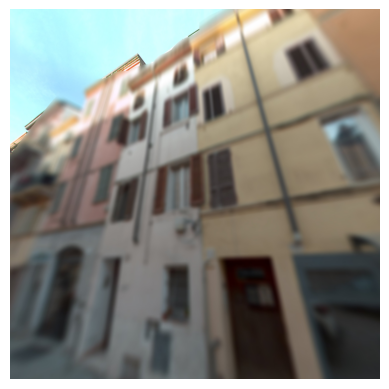

Axis difference: -1.8277128094341606, Facade half-length: 1.8316905691392797
New target: [ 605219.20671281 4962325.12364502], Midpoint: [ 605219.20671281 4962325.12364502]
Distance: 3.6156215420704694
59.63515483737338 100
block_0 102 182137853 POINT (605219.2067128094 4962325.123645015) S pano_000117_000032.jpg


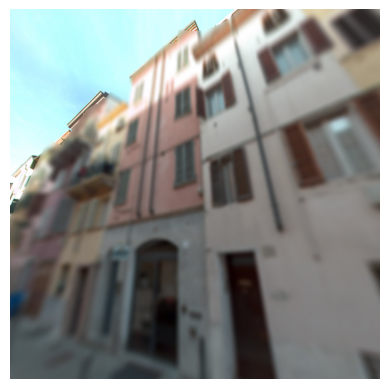

Axis difference: -1.2315800567157567, Facade half-length: 1.891088891494116
New target: [ 605215.80058006 4962326.62348386], Midpoint: [ 605215.80058006 4962326.62348386]
Distance: 3.704216370976014
70.58059325389885 100
block_0 87 182137654 POINT (605215.8005800567 4962326.623483861) S pano_000117_000033.jpg


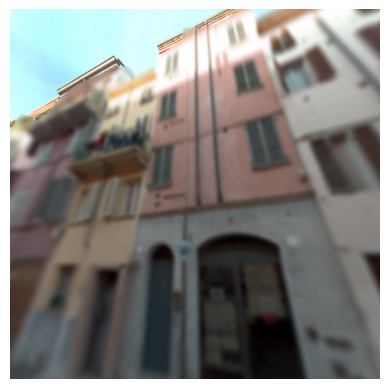

Axis difference: -0.7069364334456623, Facade half-length: 1.6845579771901396
New target: [ 605212.48793643 4962327.96929556], Midpoint: [ 605212.48793643 4962327.96929556]
Distance: 3.742667036302111
79.1122355839789 100
block_0 78 182137556 POINT (605212.4879364334 4962327.969295556) S pano_000117_000034.jpg


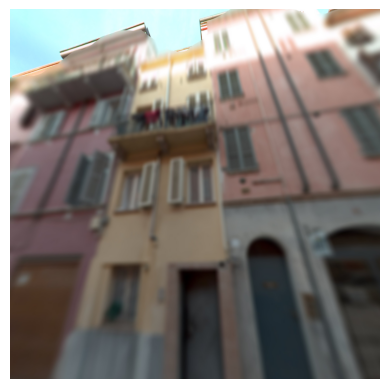

Axis difference: -2.405965826124884, Facade half-length: 2.5097100273333384
New target: [ 605208.58296583 4962329.49986359], Midpoint: [ 605208.58296583 4962329.49986359]
Distance: 3.659093933225462
48.888195252449016 100
block_0 60 182137110 POINT (605208.5829658262 4962329.49986359) S pano_000117_000036.jpg


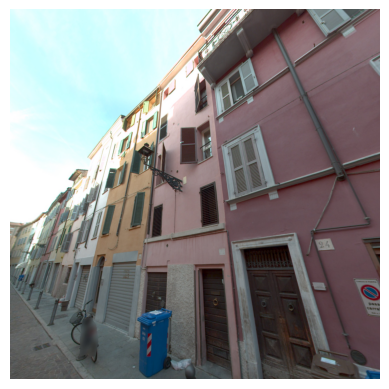

Axis difference: -1.2449102365644649, Facade half-length: 1.7245121962842356
New target: [ 605204.64591024 4962331.05768677], Midpoint: [ 605204.64591024 4962331.05768677]
Distance: 3.3134451510259897
67.93150399076363 110
block_0 96 182137766 POINT (605204.6459102365 4962331.057686775) S pano_000117_000037.jpg


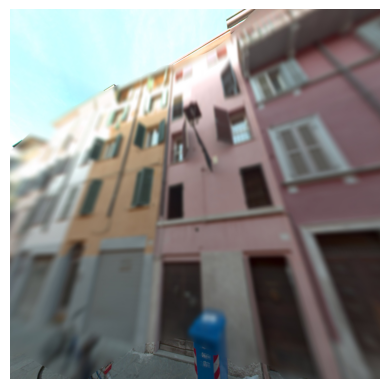

Axis difference: -0.46562394546344876, Facade half-length: 2.1173364984924423
New target: [ 605201.08262395 4962332.49384889], Midpoint: [ 605201.08262395 4962332.49384889]
Distance: 3.2474036295353987
81.75632028255295 110
block_0 91 182137721 POINT (605201.0826239454 4962332.493848888) S pano_000117_000038.jpg


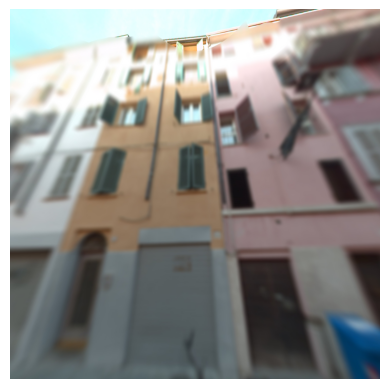

Axis difference: -2.2691287781344727, Facade half-length: 1.8525616939695049
New target: [ 605196.5362013  4962334.31115492], Midpoint: [ 605197.39612878 4962333.96688622]
Distance: 3.11144691901218
60.32555113080561 110
block_0 115 182137972 POINT (605197.3961287781 4962333.966886216) S pano_000117_000040.jpg


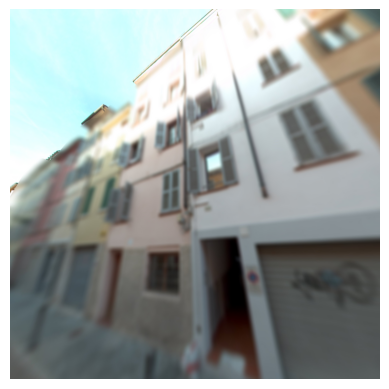

Axis difference: -1.2367396365152672, Facade half-length: 2.2285555549265887
New target: [ 605193.61373964 4962335.499469  ], Midpoint: [ 605193.61373964 4962335.499469  ]
Distance: 2.718123451019835
62.9352204327723 110
block_0 97 182137768 POINT (605193.6137396365 4962335.499468997) S pano_000117_000041.jpg


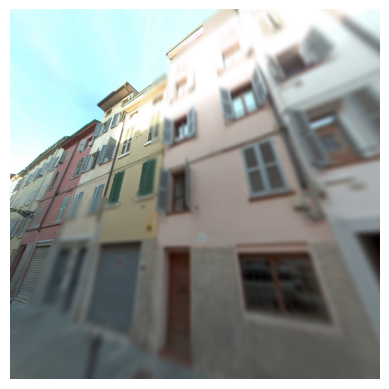

Axis difference: 19.957788045168854, Facade half-length: 13.80832173516298
New target: [ 605182.71286808 4962281.51993078], Midpoint: [ 605189.01021195 4962278.68957791]
Distance: 50.89569322532305
120 120


In [16]:
# Ensure all previous figures are closed
plt.close('all')

# Set %matplotlib inline to make sure interactive plotting is turned off
%matplotlib inline

images_folder = 'data/PANO/'

for i, row in gdf_combined.iterrows():
    # Camera and target coordinates (2D only, ignoring z)
    camera_coords = (row.loc['X'], row.loc['Y'], row.loc['Z'])  # Camera position (x, y, z)
    midpoint_coords = (row.loc['geometry_midpoint'].x, row.loc['geometry_midpoint'].y, row.loc['Z'])  # Target position (x, y, z)

    # Facade segment extremes (ensure only x, y are considered)
    facade_start = (row.loc['geometry_outer_edge'].coords[0][:2])  # One end of the facade segment (x, y)
    facade_end = (row.loc['geometry_outer_edge'].coords[-1][:2])  # The other end of the facade segment (x, y)

    # Retrieve facade orientation from the data (assumed to be in row['orientation_outer_edge'])
    orientation = row.loc['orientation_outer_edge']

    # Calculate a new target based on the facade segment and camera's position
    new_target_coords = calculate_new_target(midpoint_coords, facade_start, facade_end, camera_coords, orientation)
    new_target_coords = (new_target_coords[0], new_target_coords[1], row.loc['Z'])  # Reintroduce z coordinate
    
    # Calculate yaw and pitch using the new target
    yaw, pitch = calculate_yaw_pitch(camera_coords, new_target_coords)

    # Adjust pitch (fixed value for now)
    pitch_adjustment = 25  # degrees
    pitch += pitch_adjustment

    # Calculate dynamic FoV based on vectors
    v1, v2 = calculate_vectors(camera_coords, new_target_coords)
    calculated_fov = calculate_dynamic_fov(v1, v2)

    # Adjust FoV based on the distance between camera and midpoint
    fov, distance = adjust_fov_based_on_distance(camera_coords, midpoint_coords, calculated_fov)

    print(calculated_fov, fov)

    if distance > 20:
        break  # Skip further processing if the camera is too far from the target

    # Path to the image
    path = row.loc['PATH']
    run = row.loc['RUN']
    image_name = row.loc['FOTO']
    image_path = '{}{}/{}/{}'.format(images_folder, path, run, image_name)
    image = cv2.imread(image_path)

    # Convert the original image to RGB before any further processing
    rgb_image = convert_bgr_to_rgb(image)

    # Parameters for perspective projection
    roll = row.loc['Roll']

    output_image_shape = 'squared'  # 'squared', 'horizontal' or 'vertical'
    if output_image_shape == 'squared':
        output_width = 1024
        output_height = 1024
    elif output_image_shape == 'horizontal':
        output_width = 1024
        output_height = 512
    elif output_image_shape == 'vertical':
        output_width = 512
        output_height = 1024

    # Apply the transformation
    output_image = enhanced_equirectangular_to_perspective(rgb_image, fov, yaw, pitch, roll, output_height, output_width)

    print(row.loc['group_id'], row.loc['building_id'], row.loc['osm_id'], row.loc['geometry_midpoint'], row.loc['orientation_midpoint'], image_name)

    # Display the transformed image
    plt.imshow(output_image)
    plt.axis('off')  # Hide the axes
    plt.show()

    # Close the figure to prevent old plots from showing up again
    plt.close('all')  # Close all figures
